# Introduction:
Supermarkets often change their store layouts, product selections, prices and promotions. As part of the Quantium retail analytics team, the goal of this project is to evaluate and analyse the performance of change and recommend whether it has been successful. We will be looking at the Chips Category for retail stores across 1 year

## Goal:
The insights from the analysis will feed into the supermarket’s strategic plan for the chip category in the next half year.
## Part 1:
This notebook is to help the Category Mangager for Chips, gain a better understanding of the types of customers who purchase Chips and their purchasing behaviour within the region

In [92]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [206]:
trans_data = pd.read_excel("QVI_transaction_data.xlsx")
purc_data = pd.read_csv("QVI_purchase_behaviour.csv")

In [207]:
trans_data.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8


In [208]:
purc_data.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream


## Data Checks/Cleaning

In [209]:
trans_data.isnull().sum()

DATE              0
STORE_NBR         0
LYLTY_CARD_NBR    0
TXN_ID            0
PROD_NBR          0
PROD_NAME         0
PROD_QTY          0
TOT_SALES         0
dtype: int64

In [210]:
purc_data.isnull().sum()

LYLTY_CARD_NBR      0
LIFESTAGE           0
PREMIUM_CUSTOMER    0
dtype: int64

In [211]:
trans_data.dtypes

DATE                int64
STORE_NBR           int64
LYLTY_CARD_NBR      int64
TXN_ID              int64
PROD_NBR            int64
PROD_NAME          object
PROD_QTY            int64
TOT_SALES         float64
dtype: object

In [212]:
purc_data.dtypes

LYLTY_CARD_NBR       int64
LIFESTAGE           object
PREMIUM_CUSTOMER    object
dtype: object

In [213]:
trans_data.shape

(264836, 8)

In [214]:
purc_data.shape

(72637, 3)

In [215]:
#Check duplicates
purc_data.duplicated().sum()

0

In [216]:
trans_data[trans_data.duplicated() == True]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
124845,43374,107,107024,108462,45,Smiths Thinly Cut Roast Chicken 175g,2,6.0


In [217]:
#Remove duplicated row
trans_data = trans_data.drop_duplicates()

In [218]:
trans_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 264835 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DATE            264835 non-null  int64  
 1   STORE_NBR       264835 non-null  int64  
 2   LYLTY_CARD_NBR  264835 non-null  int64  
 3   TXN_ID          264835 non-null  int64  
 4   PROD_NBR        264835 non-null  int64  
 5   PROD_NAME       264835 non-null  object 
 6   PROD_QTY        264835 non-null  int64  
 7   TOT_SALES       264835 non-null  float64
dtypes: float64(1), int64(6), object(1)
memory usage: 18.2+ MB


In [219]:
purc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [220]:
trans_data.describe()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,264835.000000,264835.000000,2.648350e+05,2.648350e+05,264835.000000,264835.000000,264835.000000
mean,43464.036600,135.080216,1.355496e+05,1.351584e+05,56.583201,1.907308,7.304205
std,105.389336,76.784306,8.058011e+04,7.813316e+04,32.826692,0.643655,3.083231
min,43282.000000,1.000000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.500000
25%,43373.000000,70.000000,7.002100e+04,6.760100e+04,28.000000,2.000000,5.400000
50%,43464.000000,130.000000,1.303580e+05,1.351380e+05,56.000000,2.000000,7.400000
75%,43555.000000,203.000000,2.030945e+05,2.027015e+05,85.000000,2.000000,9.200000
max,43646.000000,272.000000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


In [221]:
#Convert Date col to Datetime format 

origin = pd.Timestamp("30/12/1899")

trans_data["DATE"] = trans_data["DATE"].apply(lambda x: origin + pd.Timedelta(days=x))

c:\Users\I am Navin\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3185: UserWarning: Parsing '30/12/1899' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [108]:
#Total sales
trans_data['TOT_SALES'].sum()

1934408.9999999998

- Total amount of $ spent on chip packets in the year - $1,934,409

In [109]:
#Total amount of chip packets bought
trans_data['PROD_QTY'].sum()

505122

- Total amount of chip packets purchases, 505,122 packets

In [110]:
purc_data.describe()

,LYLTY_CARD_NBR
count,7.263700e+04
mean,1.361859e+05
std,8.989293e+04
min,1.000000e+03
25%,6.620200e+04
50%,1.340400e+05
75%,2.033750e+05
max,2.373711e+06


In [111]:
#Categorical Variables

#What are the different tpyes of chip packets
trans_data['PROD_NAME'].value_counts(ascending=False)

Kettle Mozzarella   Basil & Pesto 175g      3304
Kettle Tortilla ChpsHny&Jlpno Chili 150g    3296
Cobs Popd Swt/Chlli &Sr/Cream Chips 110g    3269
Tyrrells Crisps     Ched & Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g              3265
                                            ... 
RRD Pc Sea Salt     165g                    1431
Woolworths Medium   Salsa 300g              1430
NCC Sour Cream &    Garden Chives 175g      1419
French Fries Potato Chips 175g              1418
WW Crinkle Cut      Original 175g           1410
Name: PROD_NAME, Length: 114, dtype: int64

- 114 different chip packets
- Kettle Mozzarella Basil & Pesto has the most packets purchased in the year

In [112]:
# How many packets of chips are people buying per transaction
trans_data['PROD_QTY'].value_counts()

2      236038
1       27518
5         450
3         430
4         397
200         2
Name: PROD_QTY, dtype: int64

- Majority of people are purchasing 2 packets per transaction
- Purchases of 200 are outliers?
    - Remove them


In [113]:
trans_data = trans_data.drop(trans_data[trans_data['PROD_QTY'] == 200].index)
trans_data

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


- 72637 total unique customers in the given year

In [114]:
trans_data.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8


In [115]:
purc_data.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream


## Data Visualisations
- Seasonality of chip purchases. Does it increase/decrease/stay same throughout the year
- What chip packet sees the greatest sales

In [116]:
trans_data

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


In [118]:
#Seasonality of Chip Purcahses
chip_purc_date = trans_data.groupby('DATE')['PROD_QTY'].sum().reset_index()

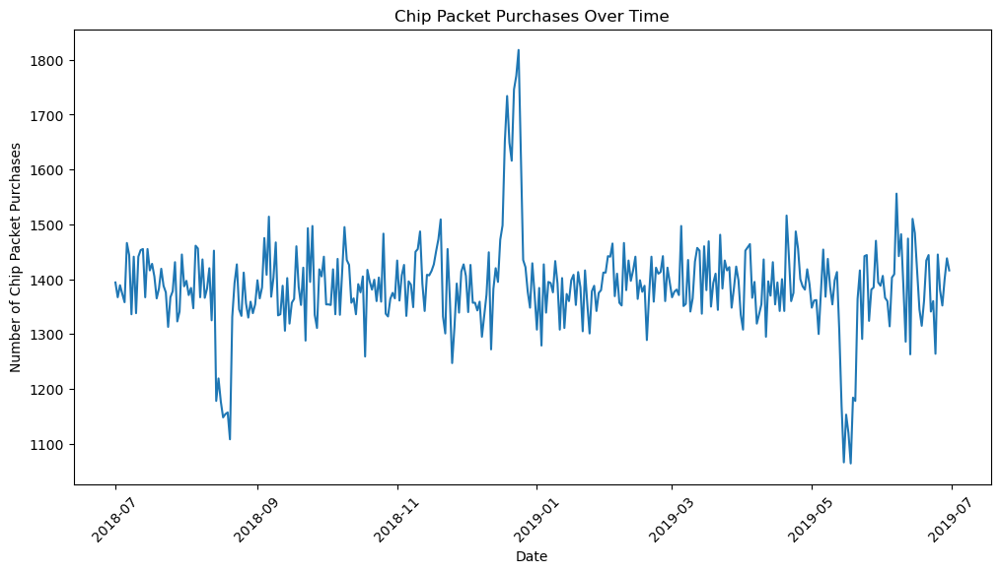

In [119]:
plt.figure(figsize=(12, 6))
sns.lineplot(x = 'DATE', y = 'PROD_QTY', data = chip_purc_date )
plt.title('Chip Packet Purchases Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Chip Packet Purchases')
plt.xticks(rotation=45)
plt.show()

- Increase in sales around Decemeber and a break in late December.
    - Due to Christmas and being closed on Christmas day itself

In [120]:
chip_purc_type = trans_data.groupby('PROD_NAME')['PROD_QTY'].sum().reset_index()
chip_purc_type = chip_purc_type.sort_values('PROD_QTY', ascending=False)

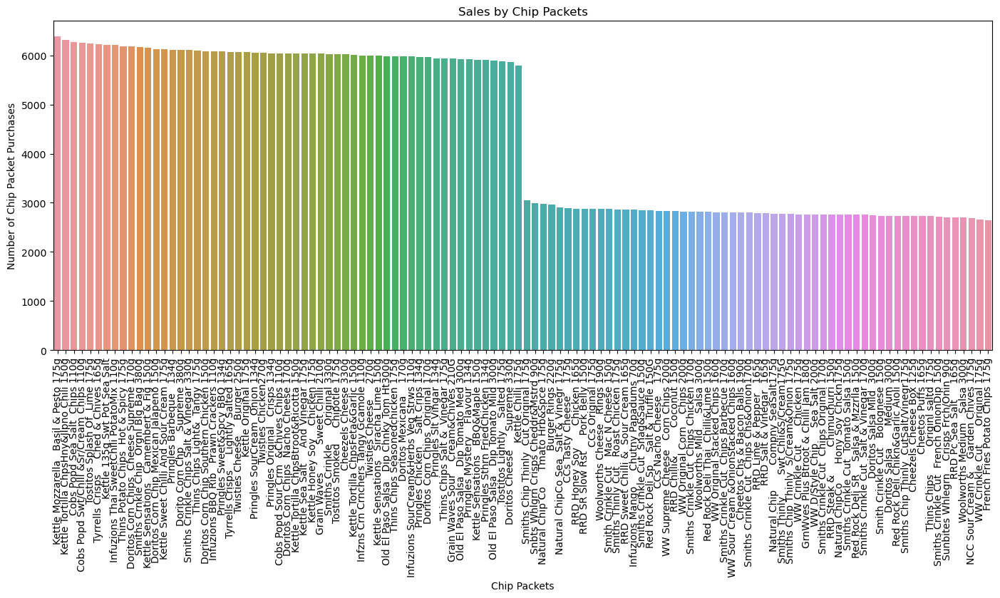

In [121]:
plt.figure(figsize=(17, 6))
sns.barplot(x = 'PROD_NAME', y = 'PROD_QTY' ,data = chip_purc_type)
plt.title('Sales by Chip Packets')
plt.xlabel('Chip Packets')
plt.ylabel('Number of Chip Packet Purchases')
plt.xticks(rotation=90)
plt.show()

- The top 57 chip packets that make the majority of sales before seeing a reduction by ~ half the amount of sales for the remaining chip brands

In [122]:
chip_purc_type = chip_purc_type[:10]

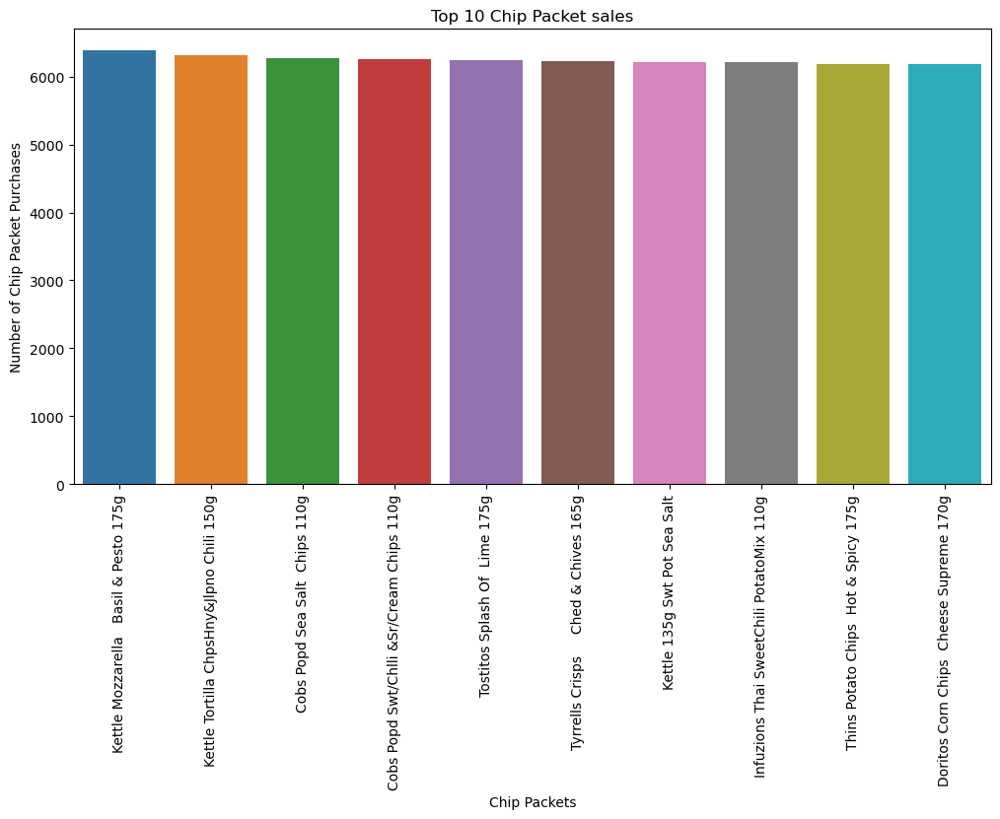

In [123]:
plt.figure(figsize=(12, 6))
sns.barplot(x = 'PROD_NAME', y = 'PROD_QTY' ,data = chip_purc_type)
plt.title('Top 10 Chip Packet sales')
plt.xlabel('Chip Packets')
plt.ylabel('Number of Chip Packet Purchases')
plt.xticks(rotation=90)
plt.show()


- Top Chip packet by sales is Cobs Popd Sea Salt Chips 110g
- The top 3 Chip packets have majority of total 

## Feature Engineering
- Create new feautre of the size of the chips
- Price of each Chip Packet

In [124]:
import regex as re

In [125]:
test = trans_data['PROD_NAME'][1]

In [126]:
test

'CCs Nacho Cheese    175g'

In [127]:
#Find where there is a g with a number beside it, then take the last 4 characters from the g
re.search(r'(\d+)[gG]', test).group()

'175g'

In [128]:
sizes = []
for name in trans_data['PROD_NAME']:
    print(name)
    size = re.search(r'(\d+)[gG]', name).group()
    print(size)
    sizes.append(size)

Natural Chip        Compny SeaSalt175g
175g
CCs Nacho Cheese    175g
175g
Smiths Crinkle Cut  Chips Chicken 170g
170g
Smiths Chip Thinly  S/Cream&Onion 175g
175g
Kettle Tortilla ChpsHny&Jlpno Chili 150g
150g
Old El Paso Salsa   Dip Tomato Mild 300g
300g
Smiths Crinkle Chips Salt & Vinegar 330g
330g
Grain Waves         Sweet Chilli 210g
210g
Doritos Corn Chip Mexican Jalapeno 150g
150g
Grain Waves Sour    Cream&Chives 210G
210G
Smiths Crinkle Chips Salt & Vinegar 330g
330g
Kettle Sensations   Siracha Lime 150g
150g
Twisties Cheese     270g
270g
WW Crinkle Cut      Chicken 175g
175g
Thins Chips Light&  Tangy 175g
175g
CCs Original 175g
175g
Burger Rings 220g
220g
NCC Sour Cream &    Garden Chives 175g
175g
Doritos Corn Chip Southern Chicken 150g
150g
Cheezels Cheese Box 125g
125g
Smiths Crinkle      Original 330g
330g
NCC Sour Cream &    Garden Chives 175g
175g
Infzns Crn Crnchers Tangy Gcamole 110g
110g
Kettle Sea Salt     And Vinegar 175g
175g
Kettle Tortilla ChpsHny&Jlpno Chili 150g
1

180g
Old El Paso Salsa   Dip Chnky Tom Ht300g
300g
Kettle Tortilla ChpsBtroot&Ricotta 150g
150g
WW Supreme Cheese   Corn Chips 200g
200g
Cheetos Chs & Bacon Balls 190g
190g
Cheetos Chs & Bacon Balls 190g
190g
Smiths Thinly       Swt Chli&S/Cream175G
175G
Smiths Chip Thinly  Cut Original 175g
175g
Kettle Tortilla ChpsHny&Jlpno Chili 150g
150g
RRD Salt & Vinegar  165g
165g
Smiths Crinkle Cut  Snag&Sauce 150g
150g
Pringles Slt Vingar 134g
134g
Infzns Crn Crnchers Tangy Gcamole 110g
110g
Pringles Mystery    Flavour 134g
134g
Smith Crinkle Cut   Bolognese 150g
150g
Cheezels Cheese 330g
330g
Smiths Crnkle Chip  Orgnl Big Bag 380g
380g
Old El Paso Salsa   Dip Tomato Mild 300g
300g
CCs Tasty Cheese    175g
175g
Cobs Popd Swt/Chlli &Sr/Cream Chips 110g
110g
Kettle Honey Soy    Chicken 175g
175g
Smiths Chip Thinly  Cut Original 175g
175g
Cheezels Cheese Box 125g
125g
Cheetos Chs & Bacon Balls 190g
190g
Pringles Mystery    Flavour 134g
134g
Red Rock Deli Thai  Chilli&Lime 150g
150g
Woolworths Med

In [129]:
#Append to the dataframe
trans_data['chip_size'] = sizes

In [130]:
#Remove the g's
trans_data['chip_size'] = [re.sub(r'[gG]', '', string) for string in trans_data['chip_size']]

In [131]:
trans_data

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,chip_size
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150
...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150


In [132]:
chip_purc_type = trans_data.groupby('PROD_NAME')['PROD_QTY'].sum().reset_index()
chip_purc_type = chip_purc_type.sort_values('PROD_QTY', ascending=False)

In [133]:
chip_size_sales = trans_data.groupby('chip_size')['PROD_QTY'].sum().reset_index() 
chip_size_sales['chip_size'] = chip_size_sales['chip_size'].astype(int)
chip_size_sales = chip_size_sales.sort_values('chip_size', ascending=True)
chip_size_sales

,chip_size,PROD_QTY
19,70,2855
20,90,5692
0,110,42835
1,125,2730
2,134,48019
3,135,6212
4,150,82174
5,160,5604
6,165,29051
7,170,38088


In [134]:
chip_size_sales.dtypes

chip_size    int32
PROD_QTY     int64
dtype: object

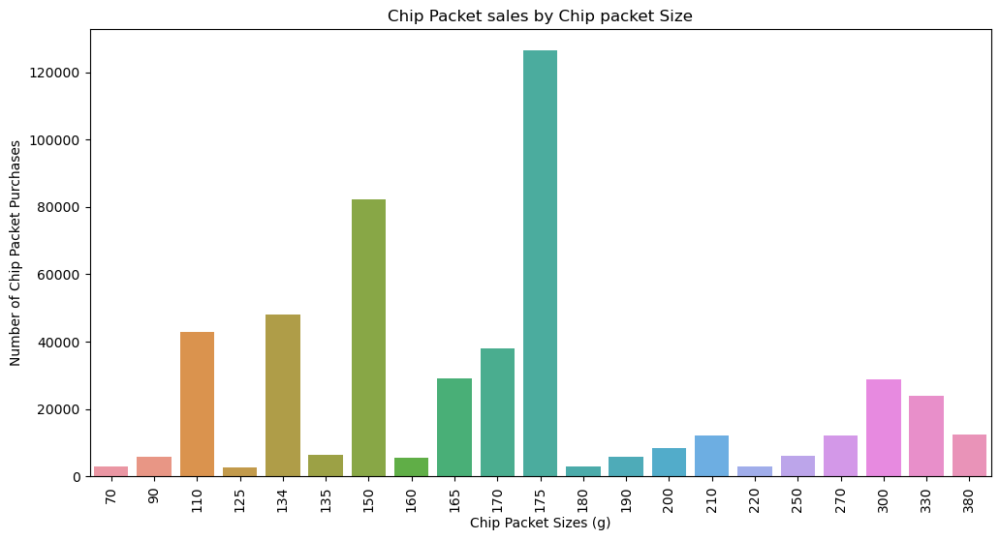

In [135]:
plt.figure(figsize=(12, 6))
sns.barplot(x = 'chip_size', y = 'PROD_QTY' ,data = chip_size_sales)
plt.title('Chip Packet sales by Chip packet Size')
plt.xlabel('Chip Packet Sizes (g)')
plt.ylabel('Number of Chip Packet Purchases')
plt.xticks(rotation=90)
plt.show()


- Clear to see the most popular size of chip packet is 175 gram

In [136]:
#How many of each sizes are there
# trans_data.groupby('chip_size')['PROD_NAME'].sum().reset_index()

In [137]:
all_chips = (trans_data['PROD_NAME'].unique())
all_chips

array(['Natural Chip        Compny SeaSalt175g',
       'CCs Nacho Cheese    175g',
       'Smiths Crinkle Cut  Chips Chicken 170g',
       'Smiths Chip Thinly  S/Cream&Onion 175g',
       'Kettle Tortilla ChpsHny&Jlpno Chili 150g',
       'Old El Paso Salsa   Dip Tomato Mild 300g',
       'Smiths Crinkle Chips Salt & Vinegar 330g',
       'Grain Waves         Sweet Chilli 210g',
       'Doritos Corn Chip Mexican Jalapeno 150g',
       'Grain Waves Sour    Cream&Chives 210G',
       'Kettle Sensations   Siracha Lime 150g',
       'Twisties Cheese     270g', 'WW Crinkle Cut      Chicken 175g',
       'Thins Chips Light&  Tangy 175g', 'CCs Original 175g',
       'Burger Rings 220g', 'NCC Sour Cream &    Garden Chives 175g',
       'Doritos Corn Chip Southern Chicken 150g',
       'Cheezels Cheese Box 125g', 'Smiths Crinkle      Original 330g',
       'Infzns Crn Crnchers Tangy Gcamole 110g',
       'Kettle Sea Salt     And Vinegar 175g',
       'Smiths Chip Thinly  Cut Original 175g', 'K

In [138]:
all_chips.size

114

In [139]:
unique_sizes = []
for chip in all_chips:
    print(chip)
    size = re.search(r'(\d+)[gG]', chip).group()
    print(size)
    unique_sizes.append(size)
unique_sizes = np.array(unique_sizes)

Natural Chip        Compny SeaSalt175g
175g
CCs Nacho Cheese    175g
175g
Smiths Crinkle Cut  Chips Chicken 170g
170g
Smiths Chip Thinly  S/Cream&Onion 175g
175g
Kettle Tortilla ChpsHny&Jlpno Chili 150g
150g
Old El Paso Salsa   Dip Tomato Mild 300g
300g
Smiths Crinkle Chips Salt & Vinegar 330g
330g
Grain Waves         Sweet Chilli 210g
210g
Doritos Corn Chip Mexican Jalapeno 150g
150g
Grain Waves Sour    Cream&Chives 210G
210G
Kettle Sensations   Siracha Lime 150g
150g
Twisties Cheese     270g
270g
WW Crinkle Cut      Chicken 175g
175g
Thins Chips Light&  Tangy 175g
175g
CCs Original 175g
175g
Burger Rings 220g
220g
NCC Sour Cream &    Garden Chives 175g
175g
Doritos Corn Chip Southern Chicken 150g
150g
Cheezels Cheese Box 125g
125g
Smiths Crinkle      Original 330g
330g
Infzns Crn Crnchers Tangy Gcamole 110g
110g
Kettle Sea Salt     And Vinegar 175g
175g
Smiths Chip Thinly  Cut Original 175g
175g
Kettle Original 175g
175g
Red Rock Deli Thai  Chilli&Lime 150g
150g
Pringles Sthrn FriedC

In [140]:
unique_sizes.size

114

In [141]:
u_val, val_count = np.unique(unique_sizes, return_counts=True)

In [142]:
#Remove the g's
u_val = [re.sub(r'[gG]', '', string) for string in u_val]

In [143]:
u_val = [int(element) for element in u_val]

In [144]:
unique_sizes_df = pd.DataFrame({'Size':u_val,'count':val_count})
unique_sizes_df = unique_sizes_df.groupby('Size').sum().reset_index()
unique_sizes_df = unique_sizes_df.sort_values(by='count', ascending = False)
unique_sizes_df

,Size,count
10,175,30
6,150,20
9,170,9
4,134,8
8,165,8
2,110,7
18,300,7
19,330,4
13,200,3
12,190,2


- 175 gram packets have the greatest % of sizes of packets sold

In [145]:
# Price of each Chip Packet
trans_data['indiv_val'] = trans_data['TOT_SALES'] / trans_data['PROD_QTY']
trans_data['indiv_val'] = trans_data['indiv_val'].round(2)  # Round to 2 decimal places

In [146]:
trans_data

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,chip_size,indiv_val
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,3.00
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,2.10
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,1.45
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175,3.00
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150,4.60
...,...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,5.40
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,4.40
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,4.40
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,3.90


In [147]:
trans_data.groupby('PROD_NAME')['indiv_val'].mean().reset_index()

,PROD_NAME,indiv_val
0,Burger Rings 220g,2.3
1,CCs Nacho Cheese 175g,2.1
2,CCs Original 175g,2.1
3,CCs Tasty Cheese 175g,2.1
4,Cheetos Chs & Bacon Balls 190g,3.3
...,...,...
109,WW Sour Cream &OnionStacked Chips 160g,1.9
110,WW Supreme Cheese Corn Chips 200g,1.9
111,Woolworths Cheese Rings 190g,1.8
112,Woolworths Medium Salsa 300g,1.5


## Merge Customer Data with the Transaction Data by the Loyalty Card Numbers

In [148]:
combined_df = pd.merge(trans_data, purc_data, on='LYLTY_CARD_NBR')
combined_df

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,chip_size,indiv_val,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,3.00,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,2.10,MIDAGE SINGLES/COUPLES,Budget
2,2018-11-10,1,1307,346,96,WW Original Stacked Chips 160g,2,3.8,160,1.90,MIDAGE SINGLES/COUPLES,Budget
3,2019-03-09,1,1307,347,54,CCs Original 175g,1,2.1,175,2.10,MIDAGE SINGLES/COUPLES,Budget
4,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,1.45,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...
264828,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,5.40,YOUNG SINGLES/COUPLES,Premium
264829,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,4.40,YOUNG SINGLES/COUPLES,Premium
264830,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,4.40,YOUNG SINGLES/COUPLES,Premium
264831,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,3.90,YOUNG SINGLES/COUPLES,Premium


In [149]:
combined_df['LIFESTAGE'].value_counts()

OLDER SINGLES/COUPLES     54478
RETIREES                  49763
OLDER FAMILIES            48594
YOUNG FAMILIES            43592
YOUNG SINGLES/COUPLES     36377
MIDAGE SINGLES/COUPLES    25110
NEW FAMILIES               6919
Name: LIFESTAGE, dtype: int64

In [150]:
combined_df['PREMIUM_CUSTOMER'].value_counts()

Mainstream    101988
Budget         93157
Premium        69688
Name: PREMIUM_CUSTOMER, dtype: int64

## Customer Segments

- Customers Purchasing Behaviour:
    - What chips are Premium/Mainstream/Budget customers are buying?
        - Which premiums are spending the most money on chips
    - What Lifestage's are purchasing what. 
        - Which lifestages purchase the most chips
    

In [151]:
# Filter: Premium Customers
prem_cust = combined_df[combined_df['PREMIUM_CUSTOMER'] == 'Premium']
budg_cust = combined_df[combined_df['PREMIUM_CUSTOMER'] == 'Budget']
mainst_cust = combined_df[combined_df['PREMIUM_CUSTOMER'] == 'Mainstream']


In [152]:
# What type of customers are purchasing the most chips
prem_cust_qty = combined_df.groupby('PREMIUM_CUSTOMER')['PROD_QTY'].sum().reset_index()
prem_cust_qty

,PREMIUM_CUSTOMER,PROD_QTY
0,Budget,177898
1,Mainstream,193965
2,Premium,132859


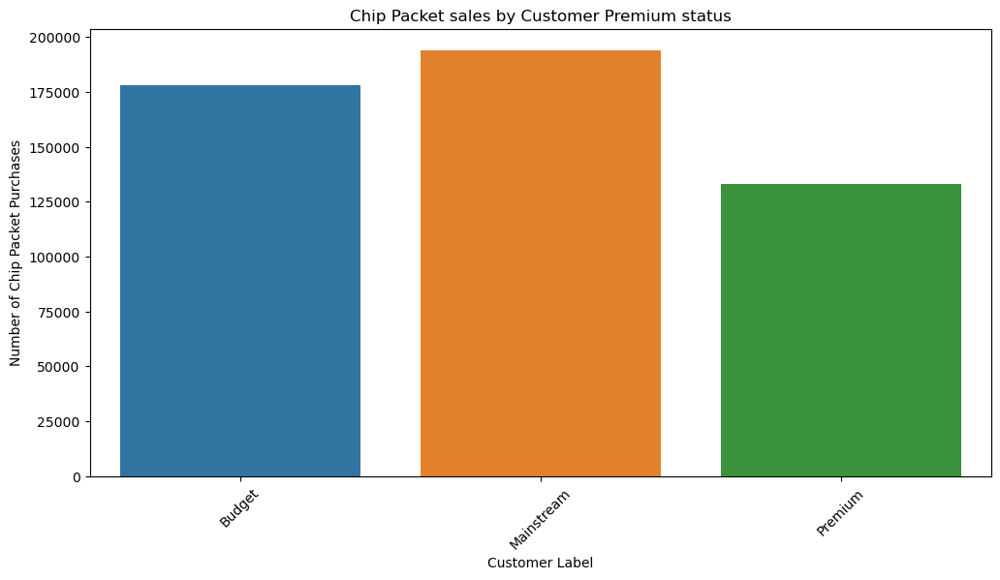

In [153]:
plt.figure(figsize=(12, 6))
sns.barplot(x = 'PREMIUM_CUSTOMER', y = 'PROD_QTY' ,data = prem_cust_qty)
plt.title('Chip Packet sales by Customer Premium status')
plt.xlabel('Customer Label')
plt.ylabel('Number of Chip Packet Purchases')
plt.xticks(rotation=45)
plt.show()


- Mainstream customers are purchasing the most chips
     - Slight lag by Budget Customers
- Premium are purchasing the least

In [154]:
# What type of customers are purchasing the most chips
prem_cust_sales = combined_df.groupby('PREMIUM_CUSTOMER')['TOT_SALES'].sum().reset_index()
prem_cust_sales

,PREMIUM_CUSTOMER,TOT_SALES
0,Budget,676211.55
1,Mainstream,750744.50
2,Premium,506152.95


- The most sales contribution is from the mainstream segment with total sales of $750,744

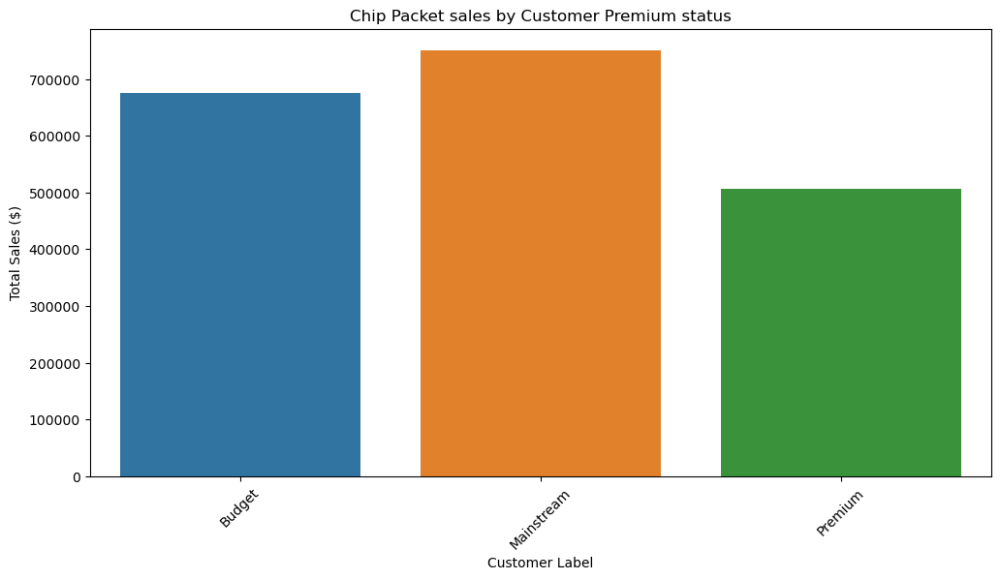

In [155]:
plt.figure(figsize=(12, 6))
sns.barplot(x = 'PREMIUM_CUSTOMER', y = 'TOT_SALES' ,data = prem_cust_sales)
plt.title('Chip Packet sales by Customer Premium status')
plt.xlabel('Customer Label')
plt.ylabel('Total Sales ($)')
plt.xticks(rotation=45)
plt.show()


In [156]:
#How many of each Customer type is there?
combined_df['PREMIUM_CUSTOMER'].value_counts()

Mainstream    101988
Budget         93157
Premium        69688
Name: PREMIUM_CUSTOMER, dtype: int64

- Majority of customers are mainstream, followed by budget and least amount are premiums
    - Therefore, the above graph doesnt tell us much

In [157]:
# What prices are each customer type willing to spend on chips

combined_df['indiv_val'].describe()

count    264833.000000
mean          3.824632
std           1.109527
min           1.320000
25%           3.000000
50%           3.800000
75%           4.600000
max           6.500000
Name: indiv_val, dtype: float64

- Chip packet range $: 1.32 - 6.50

In [158]:
#Average price each customer type is willing to spend on 1 chip packet
customer_prices = combined_df.groupby('PREMIUM_CUSTOMER')['indiv_val'].mean().reset_index()

In [159]:
customer_prices

,PREMIUM_CUSTOMER,indiv_val
0,Budget,3.793403
1,Mainstream,3.867268
2,Premium,3.803980


<AxesSubplot:xlabel='PREMIUM_CUSTOMER', ylabel='indiv_val'>

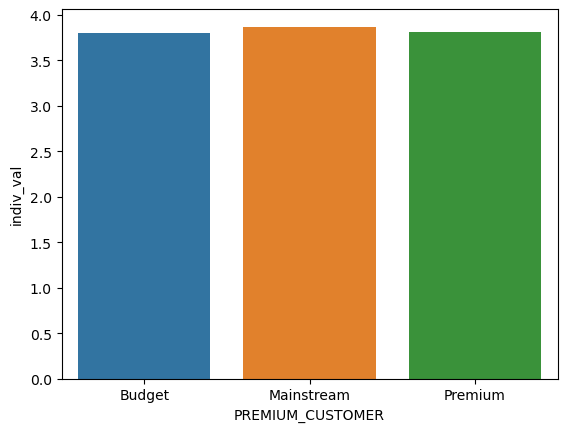

In [160]:
sns.barplot(x='PREMIUM_CUSTOMER', y='indiv_val', data=customer_prices)

In [161]:
customer_prices = combined_df.groupby('PREMIUM_CUSTOMER')['indiv_val'].unique().reset_index()
customer_prices

,PREMIUM_CUSTOMER,indiv_val
0,Budget,"[2.1, 1.9, 1.45, 3.0, 4.6, 5.1, 4.2, 6.5, 4.4,..."
1,Mainstream,"[4.4, 5.4, 3.7, 4.6, 3.3, 3.8, 5.7, 3.9, 3.0, ..."
2,Premium,"[3.0, 1.85, 1.35, 5.4, 4.4, 3.3, 3.7, 3.25, 5...."


In [162]:
customer_prices[:1] #Budget
customer_prices[1:2] #Mainstream
customer_prices[2:] #Premium

,PREMIUM_CUSTOMER,indiv_val
2,Premium,"[3.0, 1.85, 1.35, 5.4, 4.4, 3.3, 3.7, 3.25, 5...."


In [163]:
customer_prices

,PREMIUM_CUSTOMER,indiv_val
0,Budget,"[2.1, 1.9, 1.45, 3.0, 4.6, 5.1, 4.2, 6.5, 4.4,..."
1,Mainstream,"[4.4, 5.4, 3.7, 4.6, 3.3, 3.8, 5.7, 3.9, 3.0, ..."
2,Premium,"[3.0, 1.85, 1.35, 5.4, 4.4, 3.3, 3.7, 3.25, 5...."


In [164]:
budget_lst = (customer_prices['indiv_val'][:1])[0]
mainstream_lst = (customer_prices['indiv_val'][1:2])[1]
premium_lst = (customer_prices['indiv_val'][2:])[2]


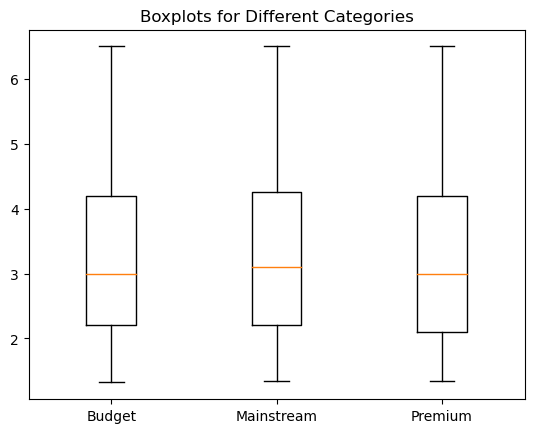

In [165]:
# Create a list of your data
data = [budget_lst, mainstream_lst, premium_lst]

# Create a figure and axes
fig, ax = plt.subplots()

# Create boxplots for each column
bp = ax.boxplot(data)

# Add labels to the x-axis
ax.set_xticklabels(['Budget', 'Mainstream', 'Premium'])

# Add a title to the plot
ax.set_title('Boxplots for Different Categories')

# Display the plot
plt.show()

- Mainstream customers are spending more money on average on chips than any other type.
    - They have a higher UQ and LQ.
- Premium have the lowest quartile, but the largest spread. 

In [166]:
# How many chip packets on average are each type buying
customer_avg_pkts = combined_df.groupby('PREMIUM_CUSTOMER')['PROD_QTY'].mean().reset_index()
customer_avg_pkts 

,PREMIUM_CUSTOMER,PROD_QTY
0,Budget,1.909658
1,Mainstream,1.901841
2,Premium,1.906483


- All customers are on average purchasing 1- 2 packets

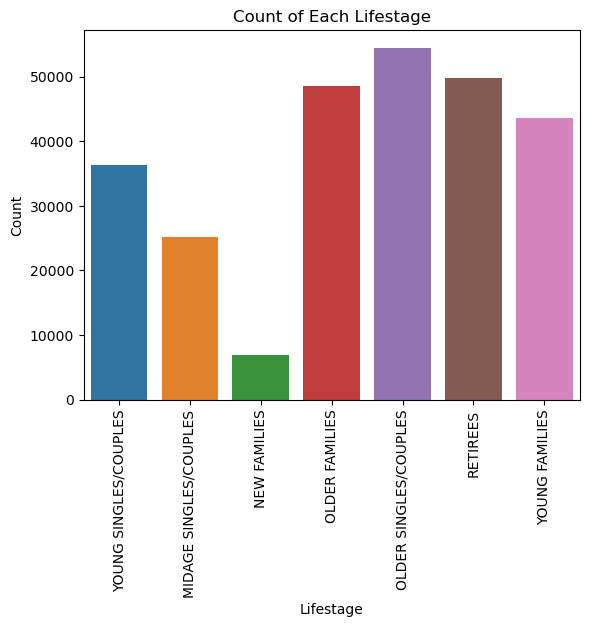

In [167]:
#Lifestages
sns.countplot(data=combined_df, x = 'LIFESTAGE')
# Add labels and title
plt.xlabel('Lifestage')
plt.ylabel('Count')
plt.title('Count of Each Lifestage')

# Rotate x-axis labels if needed
plt.xticks(rotation=90)

# Display the plot
plt.show()


- The elder people are the majority of people purchasing chips

In [168]:
#What customer segmentations are for which lifestage
lifestage_prem_count = combined_df.groupby('PREMIUM_CUSTOMER')['LIFESTAGE'].value_counts()

budg_ls = lifestage_prem_count['Budget']
main_ls = lifestage_prem_count['Mainstream']
prem_ls = lifestage_prem_count['Premium']

In [169]:
lifestage_prem_count = pd.DataFrame(lifestage_prem_count)

In [170]:
lifestage_prem_count = lifestage_prem_count.rename(columns={'LIFESTAGE':'count'})

In [171]:
lifestage_prem_count = lifestage_prem_count.reset_index()

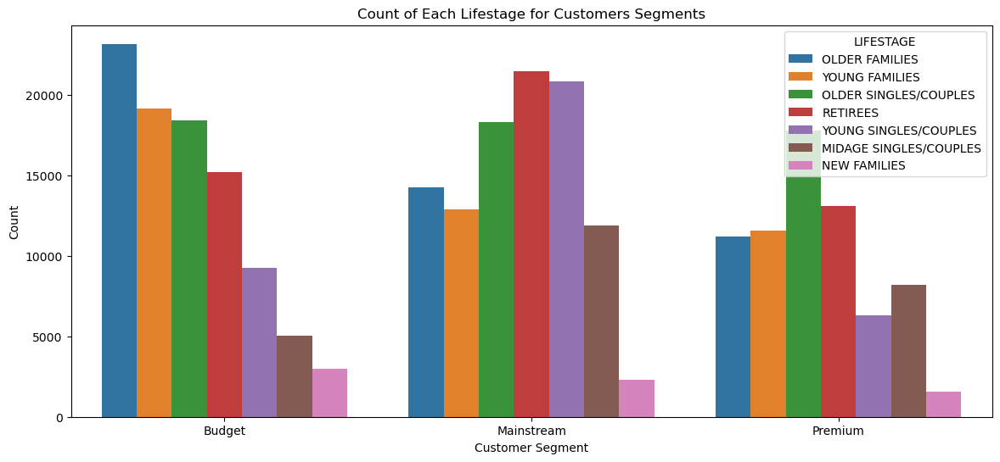

In [172]:
plt.figure(figsize=(14, 6))
sns.barplot(data=lifestage_prem_count, x='PREMIUM_CUSTOMER', y='count', hue='LIFESTAGE')
plt.xlabel('Customer Segment')
plt.ylabel('Count')
plt.title('Count of Each Lifestage for Customers Segments')

# Rotate x-axis labels if needed
plt.xticks(rotation=0)

# Display the plot
plt.show()

- Indicates the type of people you want to target for each customer segment
    - Budget:
        - Target Older families
    - Mainstream:
        - Target Retirees and Young Singles/Couples
    - Premium:
        - Older singles/couples and retirees

In [173]:
#Who are the biggest spenders. 

#Total Sales - Who spent the most on chips in the given year
tot_sales = combined_df.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['TOT_SALES'].sum().reset_index()
tot_sales = tot_sales.sort_values(by='TOT_SALES', ascending=False)
tot_sales.iloc[:5]

,LIFESTAGE,PREMIUM_CUSTOMER,TOT_SALES
6,OLDER FAMILIES,Budget,168363.25
19,YOUNG SINGLES/COUPLES,Mainstream,157621.60
13,RETIREES,Mainstream,155677.05
15,YOUNG FAMILIES,Budget,139345.85
9,OLDER SINGLES/COUPLES,Budget,136769.80


- The top 5 spenders in total.
    - Older families that are a budget customer spend the most with 168,363 dollars spent
- We can summarise that budget customer favours purchasing chip products with 3 of the top 5 spending groups being budget and the other 2 being mainstream. No premium customers were in the top 5 spenders. 
- The majority of the top 5 are of older people (Older families, singles couples and retirees)


In [174]:
#Who are the biggest spenders. 

#Avg Transaction - Who had the highest avg transaction 
avg_sales = combined_df.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['TOT_SALES'].mean().reset_index()
avg_sales = avg_sales.sort_values(by='TOT_SALES', ascending=False)
avg_sales[:5]

,LIFESTAGE,PREMIUM_CUSTOMER,TOT_SALES
1,MIDAGE SINGLES/COUPLES,Mainstream,7.647284
19,YOUNG SINGLES/COUPLES,Mainstream,7.558339
14,RETIREES,Premium,7.456174
11,OLDER SINGLES/COUPLES,Premium,7.449848
12,RETIREES,Budget,7.443445


In [175]:
sales_agg = combined_df.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['TOT_SALES'].agg([('Total Sales', 'sum'), ('Average Sales', 'mean'), ('n_trans','count')]).reset_index()
sales_agg = sales_agg.sort_values(by=['Total Sales', 'Average Sales'], ascending=False)


In [176]:
# What lifestage is purchasing the highest amount of chips
lifestage_pkts = combined_df.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])['PROD_QTY'].agg([('ttl_pkt_qty','sum'),('avg_pkt_qty','mean')]).reset_index()
lifestage_pkts = lifestage_pkts.sort_values(by = 'ttl_pkt_qty', ascending=False)
lifestage_pkts

,LIFESTAGE,PREMIUM_CUSTOMER,ttl_pkt_qty,avg_pkt_qty
6,OLDER FAMILIES,Budget,45065,1.945812
13,RETIREES,Mainstream,40518,1.887543
19,YOUNG SINGLES/COUPLES,Mainstream,38632,1.852498
15,YOUNG FAMILIES,Budget,37111,1.940749
9,OLDER SINGLES/COUPLES,Budget,35220,1.913403
10,OLDER SINGLES/COUPLES,Mainstream,34997,1.910525
11,OLDER SINGLES/COUPLES,Premium,33984,1.914268
12,RETIREES,Budget,28764,1.892244
7,OLDER FAMILIES,Mainstream,27756,1.948610
16,YOUNG FAMILIES,Mainstream,25044,1.940342


In [177]:
#Join with the Sales agg table to see the top 5 segments and lifestages for all attributes
sales_agg = pd.merge(sales_agg,lifestage_pkts,on=['LIFESTAGE','PREMIUM_CUSTOMER'])
sales_agg[:5]

,LIFESTAGE,PREMIUM_CUSTOMER,Total Sales,Average Sales,n_trans,ttl_pkt_qty,avg_pkt_qty
0,OLDER FAMILIES,Budget,168363.25,7.269570,23160,45065,1.945812
1,YOUNG SINGLES/COUPLES,Mainstream,157621.60,7.558339,20854,38632,1.852498
2,RETIREES,Mainstream,155677.05,7.252262,21466,40518,1.887543
3,YOUNG FAMILIES,Budget,139345.85,7.287201,19122,37111,1.940749
4,OLDER SINGLES/COUPLES,Budget,136769.80,7.430315,18407,35220,1.913403


- The top 5 spenders based on total sales and average transaction price.
- Biggest spenders are the Older Families, budget type.
    - $168,363 totally spent on chips
    - Average transaction sale of $7.27
        - The highest avg transaction was actually MIDAGE Singles/Couples mainstream, of $7.65. However, they didnt have a high total sales compared to the shown top 5.
    - Had the highest amount of transactions in the top 5, 23,160 total transactions made under the category. 
    - Bought the most amount of packets - 45,065 packets bought


In [179]:
lifestage_pkts

,LIFESTAGE,PREMIUM_CUSTOMER,ttl_pkt_qty,avg_pkt_qty
6,OLDER FAMILIES,Budget,45065,1.945812
13,RETIREES,Mainstream,40518,1.887543
19,YOUNG SINGLES/COUPLES,Mainstream,38632,1.852498
15,YOUNG FAMILIES,Budget,37111,1.940749
9,OLDER SINGLES/COUPLES,Budget,35220,1.913403
10,OLDER SINGLES/COUPLES,Mainstream,34997,1.910525
11,OLDER SINGLES/COUPLES,Premium,33984,1.914268
12,RETIREES,Budget,28764,1.892244
7,OLDER FAMILIES,Mainstream,27756,1.948610
16,YOUNG FAMILIES,Mainstream,25044,1.940342


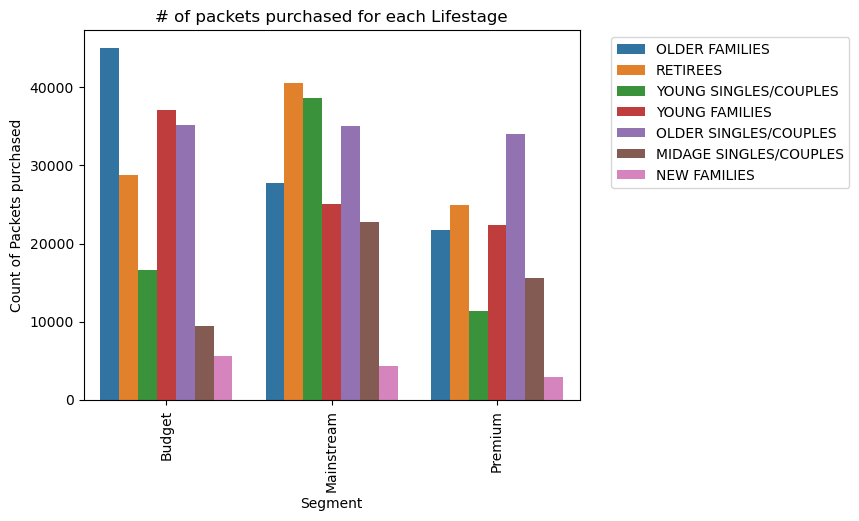

In [180]:
#Lifestages
sns.barplot(data=lifestage_pkts, x = 'PREMIUM_CUSTOMER', y = 'ttl_pkt_qty', hue = 'LIFESTAGE')
# Add labels and title
plt.xlabel('Segment')
plt.ylabel('Count of Packets purchased')
plt.title('# of packets purchased for each Lifestage')

# Rotate x-axis labels if needed
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()


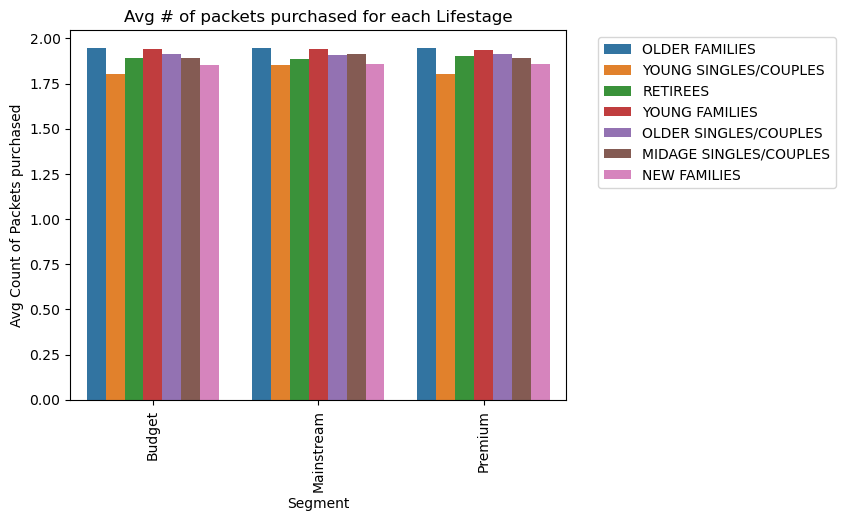

In [181]:
#Average Number of units per customer by Lifestage and Prem customer
sns.barplot(data=sales_agg, x = 'PREMIUM_CUSTOMER', y = 'avg_pkt_qty', hue = 'LIFESTAGE')
# Add labels and title
plt.xlabel('Segment')
plt.ylabel('Avg Count of Packets purchased')
plt.title('Avg # of packets purchased for each Lifestage')

# Rotate x-axis labels if needed
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()

- In general, Older Fam and young fam buy more chips per customer. 

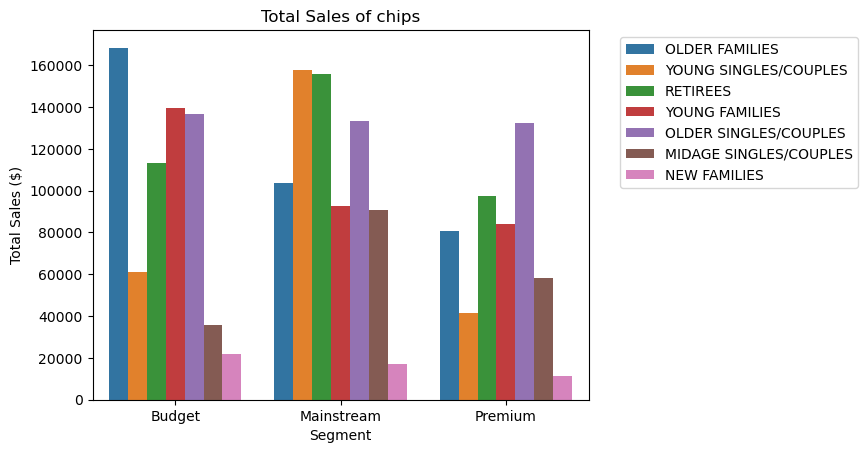

In [182]:
#Lifestages
sns.barplot(data=sales_agg, x = 'PREMIUM_CUSTOMER', y = 'Total Sales', hue = 'LIFESTAGE')
# Add labels and title
plt.xlabel('Segment')
plt.ylabel('Total Sales ($)')
plt.title('Total Sales of chips')

# Rotate x-axis labels if needed
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()


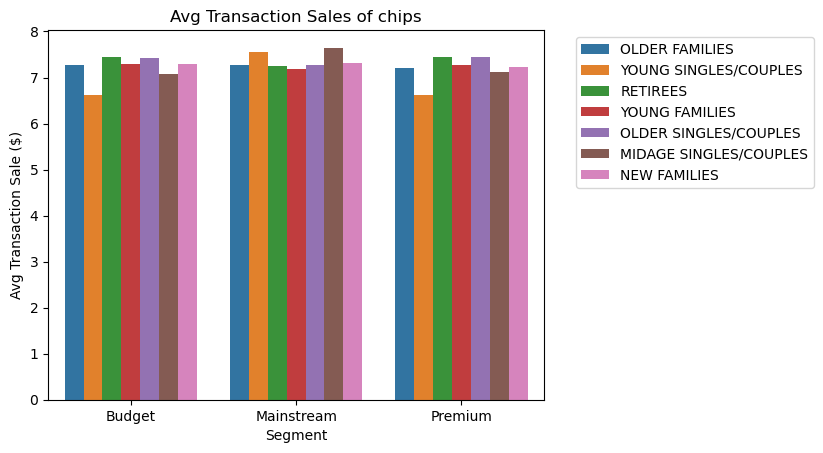

In [183]:
#Lifestages
sns.barplot(data=sales_agg, x = 'PREMIUM_CUSTOMER', y = 'Average Sales', hue = 'LIFESTAGE')
# Add labels and title
plt.xlabel('Segment')
plt.ylabel('Avg Transaction Sale ($)')
plt.title('Avg Transaction Sales of chips')

# Rotate x-axis labels if needed
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()


- Mainstream Midage and young singles/couples are willing to pay more per packet of chips compared to their counterparts in the budget and premium type. This may be due to premium customers purchasing healthier/better alternatives to common chips (i.e. pea crisps, etc). 
- The difference between avg price isnt large.

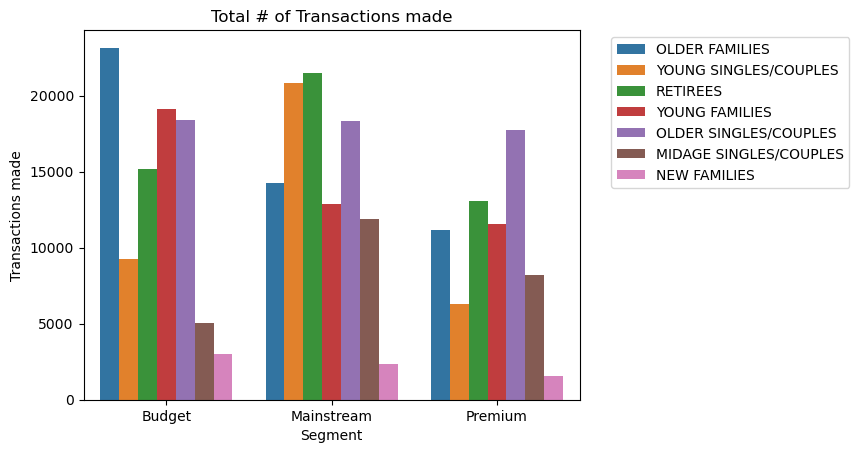

In [184]:
#Lifestages
sns.barplot(data=sales_agg, x = 'PREMIUM_CUSTOMER', y = 'n_trans', hue = 'LIFESTAGE')
# Add labels and title
plt.xlabel('Segment')
plt.ylabel('Transactions made')
plt.title('Total # of Transactions made')

# Rotate x-axis labels if needed
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()


In [185]:
#The amount of money each lifestage will spend on chips each transaction
# What lifestage is purchasing the highest amount of chips
lifestage_spend = combined_df.groupby('LIFESTAGE')['TOT_SALES'].mean().reset_index()
lifestage_spend = lifestage_spend.sort_values(by = 'TOT_SALES', ascending=False)
lifestage_spend

,LIFESTAGE,TOT_SALES
3,OLDER SINGLES/COUPLES,7.386849
4,RETIREES,7.364325
0,MIDAGE SINGLES/COUPLES,7.357678
1,NEW FAMILIES,7.289124
2,OLDER FAMILIES,7.253307
5,YOUNG FAMILIES,7.252709
6,YOUNG SINGLES/COUPLES,7.158515


- The average transaction for each lifestage.
- Older singles/couples are spending the most on average per transaction on chips

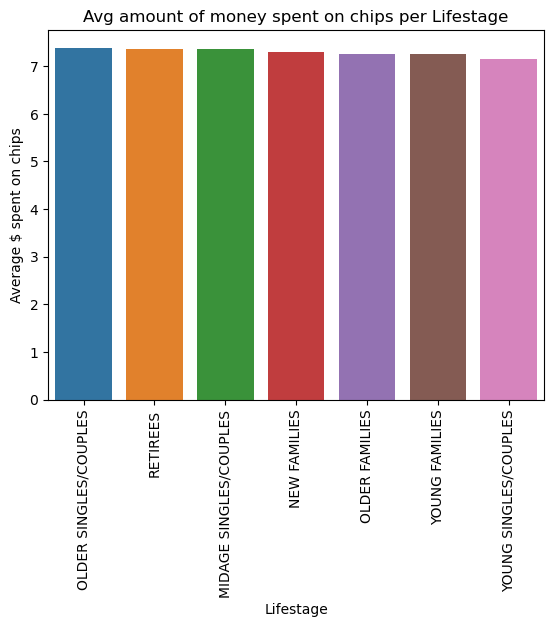

In [186]:
#Lifestages
sns.barplot(data=lifestage_spend, x = 'LIFESTAGE', y = 'TOT_SALES')
# Add labels and title
plt.xlabel('Lifestage')
plt.ylabel('Average $ spent on chips')
plt.title('Avg amount of money spent on chips per Lifestage')

# Rotate x-axis labels if needed
plt.xticks(rotation=90)

# Display the plot
plt.show()


In [187]:
#Get brand names
combined_df['brand'] = combined_df['PROD_NAME'].str.extract(r'^(\S+)')

In [188]:
#Most popular pruchased brand
combined_df['brand'].value_counts()

Kettle        41288
Smiths        28859
Pringles      25102
Doritos       24962
Thins         14075
RRD           11894
Infuzions     11057
WW            10320
Cobs           9693
Tostitos       9471
Twisties       9454
Old            9324
Tyrrells       6442
Grain          6272
Natural        6050
Red            5885
Cheezels       4603
CCs            4551
Woolworths     4437
Dorito         3183
Infzns         3144
Smith          2963
Cheetos        2927
Snbts          1576
Burger         1564
GrnWves        1468
Sunbites       1432
NCC            1419
French         1418
Name: brand, dtype: int64

In [189]:
#WHat brands are each of the customer types buying

cs_brand_count = combined_df.groupby('PREMIUM_CUSTOMER')['brand'].value_counts()

In [190]:
cs_brand_count = pd.DataFrame(cs_brand_count)

In [191]:
cs_brand_count

brand
PREMIUM_CUSTOMER brand          
Budget           Kettle    14154
                 Smiths    10430
                 Doritos    8762
                 Pringles   8620
                 Thins      4931
...                          ...
Premium          Snbts       422
                 GrnWves     405
                 Sunbites    398
                 NCC         385
                 French      372

[87 rows x 1 columns]

In [192]:
cs_brand_count = cs_brand_count.rename(columns={'brand':'count'})

In [193]:
cs_brand_count = cs_brand_count.reset_index()

In [194]:
cs_brand_count

,PREMIUM_CUSTOMER,brand,count
0,Budget,Kettle,14154
1,Budget,Smiths,10430
2,Budget,Doritos,8762
3,Budget,Pringles,8620
4,Budget,Thins,4931
...,...,...,...
82,Premium,Snbts,422
83,Premium,GrnWves,405
84,Premium,Sunbites,398
85,Premium,NCC,385


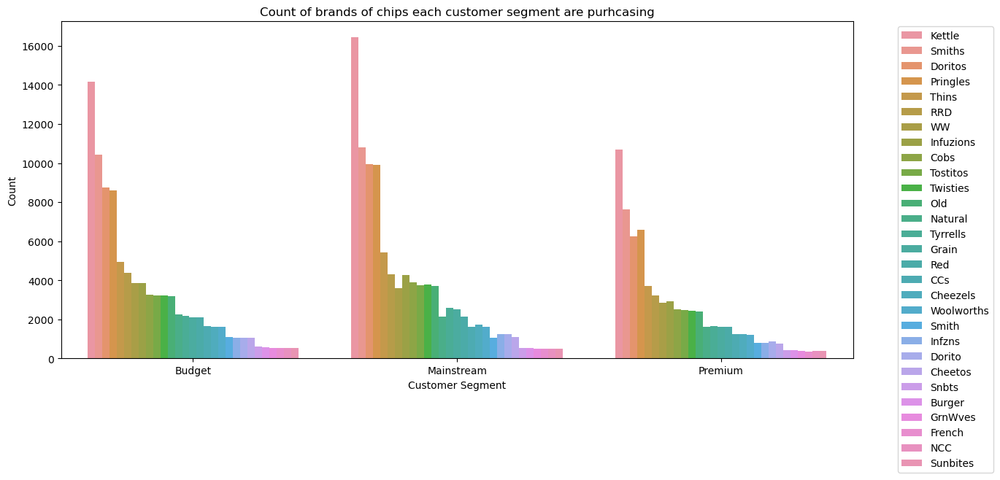

In [195]:
plt.figure(figsize=(14, 6))
sns.barplot(data=cs_brand_count, x='PREMIUM_CUSTOMER', y='count', hue='brand')
plt.xlabel('Customer Segment')
plt.ylabel('Count')
plt.title('Count of brands of chips each customer segment are purhcasing')

# Rotate x-axis labels if needed
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()

- The top 5 brands of chip pruchases are the same for all segments

In [196]:
#WHat brands are each of the customer types buying

ls_brand_count = combined_df.groupby('LIFESTAGE')['brand'].value_counts()

In [197]:
ls_brand_count = pd.DataFrame(ls_brand_count)

In [198]:
ls_brand_count

brand
LIFESTAGE              brand          
MIDAGE SINGLES/COUPLES Kettle     4055
                       Smiths     2689
                       Pringles   2389
                       Doritos    2361
                       Thins      1316
...                                ...
YOUNG SINGLES/COUPLES  Sunbites    181
                       Snbts       180
                       Burger      178
                       GrnWves     163
                       NCC         158

[203 rows x 1 columns]

In [199]:
ls_brand_count = ls_brand_count.rename(columns={'brand':'count'})

In [200]:
ls_brand_count = ls_brand_count.reset_index()

In [201]:
ls_brand_count

,LIFESTAGE,brand,count
0,MIDAGE SINGLES/COUPLES,Kettle,4055
1,MIDAGE SINGLES/COUPLES,Smiths,2689
2,MIDAGE SINGLES/COUPLES,Pringles,2389
3,MIDAGE SINGLES/COUPLES,Doritos,2361
4,MIDAGE SINGLES/COUPLES,Thins,1316
...,...,...,...
198,YOUNG SINGLES/COUPLES,Sunbites,181
199,YOUNG SINGLES/COUPLES,Snbts,180
200,YOUNG SINGLES/COUPLES,Burger,178
201,YOUNG SINGLES/COUPLES,GrnWves,163


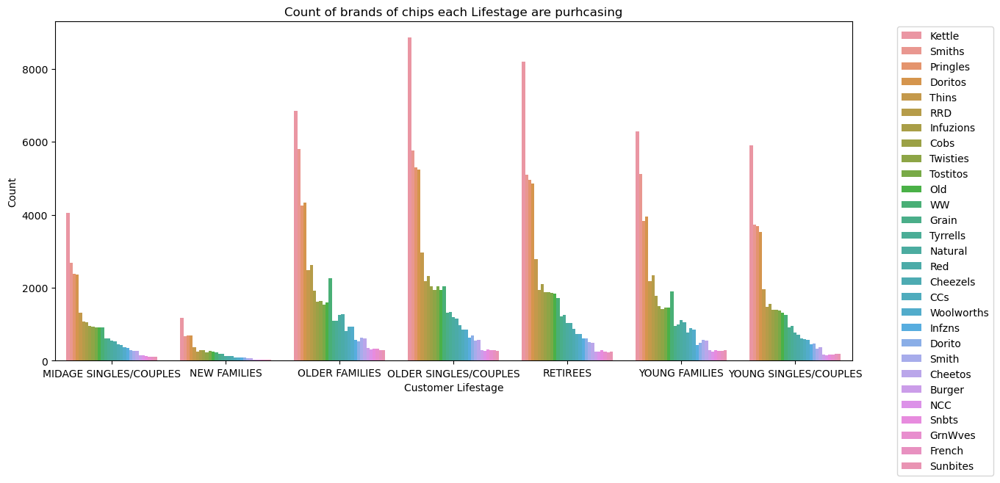

In [202]:
plt.figure(figsize=(14, 6))
sns.barplot(data=ls_brand_count, x='LIFESTAGE', y='count', hue='brand')
plt.xlabel('Customer Lifestage')
plt.ylabel('Count')
plt.title('Count of brands of chips each Lifestage are purhcasing')

# Rotate x-axis labels if needed
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# Display the plot
plt.show()

- The same top 5 are for each lifestage

In [203]:
# Do segments prefer to buy larger packets of chips
# What lifestage is purchasing the highest amount of chips
chip_size_preference = combined_df.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER', 'chip_size']).size().reset_index(name='Count')
chip_size_preference = chip_size_preference.sort_values(by = 'Count', ascending=False)
chip_size_preference

,LIFESTAGE,PREMIUM_CUSTOMER,chip_size,Count
134,OLDER FAMILIES,Budget,175,5808
281,RETIREES,Mainstream,175,5295
407,YOUNG SINGLES/COUPLES,Mainstream,175,4997
323,YOUNG FAMILIES,Budget,175,4921
197,OLDER SINGLES/COUPLES,Budget,175,4625
...,...,...,...,...
93,NEW FAMILIES,Mainstream,180,9
118,NEW FAMILIES,Premium,220,8
103,NEW FAMILIES,Mainstream,70,8
124,NEW FAMILIES,Premium,70,7


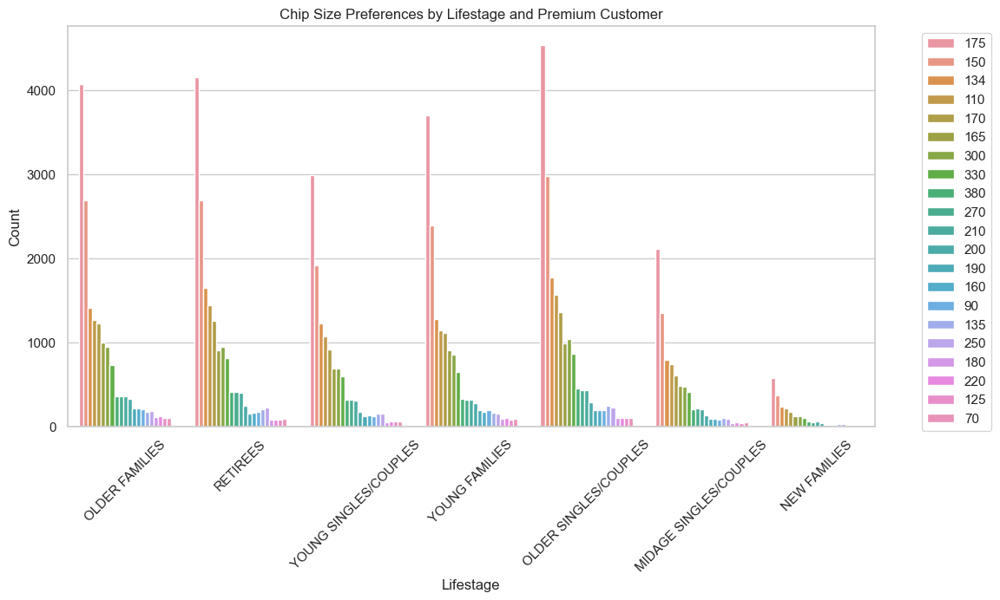

In [204]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))

sns.barplot(x=chip_size_preference['LIFESTAGE'], y=chip_size_preference['Count'], hue=chip_size_preference['chip_size'],ci=None)

plt.xlabel('Lifestage')
plt.ylabel('Count')
plt.title('Chip Size Preferences by Lifestage and Premium Customer')

plt.xticks(rotation=45)
plt.legend(title='Chip Size')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



- In general, the 175g packets are the most popular.
- The popularity of the size is relative to how big it is, the larger it is the more packets are purchased

# Conclusion

Majority of sales come from shoppers from segmentatios of:
- Budget: Older Famlilies
- Mainstream: Young Singles/Couples and Retirees

The majority of sales comes from mainstream purchasers with them spending the
most per chip packet. Mainstream is majority Young Singles/Couples and Retirees.
This is indicative of impulsive buying. 

The top spending customers are Older Families in the Budget Category. We can summarise that budget customer favours purchasing chip products with 3 of the top 5 spending groups being budget and the other 2 being mainstream. No premium customers were in the top 5 spenders. 
The majority of the top 5 are of older people (Older families, singles couples and retirees)


Kettle chips are the most purchased chip brand in all customer segments. The top
5 brands are the same for all segments.

175g packets are significantly the most popular size of chips. 

Next steps is to measure the impact of  the store trials in the next task